In [ ]:
import os
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling


root = r"F:\\CG-ODISHA\SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045.SAFE\\"
pth = "L2A_T44QNH_A045476_20251120T051052"
granule_dir = os.path.join(root, "GRANULE", pth)
img_10m_dir = os.path.join(granule_dir, "IMG_DATA", "R10m")
img_20m_dir = os.path.join(granule_dir, "IMG_DATA", "R20m")


In [4]:
def find_file(folder, suffix):
    """
    Find the first file in 'folder' whose name ends with 'suffix'.
    Example: suffix = 'B02_10m.jp2'
    """
    for f in os.listdir(folder):
        if f.endswith(suffix):
            return os.path.join(folder, f)
    raise FileNotFoundError(f"No file ending with {suffix} in {folder}")


In [ ]:

# 10m bands
b02_path = find_file(img_10m_dir, "B02_10m.jp2")
b03_path = find_file(img_10m_dir, "B03_10m.jp2")
b04_path = find_file(img_10m_dir, "B04_10m.jp2")
b08_path = find_file(img_10m_dir, "B08_10m.jp2")

# 20m bands to be upsampled
b11_path = find_file(img_20m_dir, "B11_20m.jp2")
b12_path = find_file(img_20m_dir, "B12_20m.jp2")

# Scene classification
scl_path = find_file(img_20m_dir, "SCL_20m.jp2")

print("B02:", b02_path)
print("B03:", b03_path)
print("B04:", b04_path)
print("B08:", b08_path)
print("B11:", b11_path)
print("B12:", b12_path)
print("SCL:", scl_path)


B02: F:\\CG-ODISHA\SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045.SAFE\\GRANULE\L2A_T44QNH_A045476_20251120T051052\IMG_DATA\R10m\T44QNH_20251120T050019_B02_10m.jp2
B03: F:\\CG-ODISHA\SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045.SAFE\\GRANULE\L2A_T44QNH_A045476_20251120T051052\IMG_DATA\R10m\T44QNH_20251120T050019_B03_10m.jp2
B04: F:\\CG-ODISHA\SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045.SAFE\\GRANULE\L2A_T44QNH_A045476_20251120T051052\IMG_DATA\R10m\T44QNH_20251120T050019_B04_10m.jp2
B08: F:\\CG-ODISHA\SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045.SAFE\\GRANULE\L2A_T44QNH_A045476_20251120T051052\IMG_DATA\R10m\T44QNH_20251120T050019_B08_10m.jp2
B11: F:\\CG-ODISHA\SEN2B_MSI

In [6]:
import rasterio

with rasterio.Env() as env:
    drivers = env.drivers()
    print("JP2OpenJPEG" in drivers)  # should print True
    print(drivers.get("JP2OpenJPEG"))


True
JPEG-2000 driver based on JP2OpenJPEG library


In [ ]:
def read_band(path):
    with rasterio.open(path) as src:
        data = src.read(1)
        profile = src.profile
    return data, profile


b02, profile_10m = read_band(b02_path)
b03, _ = read_band(b03_path)
b04, _ = read_band(b04_path)
b08, _ = read_band(b08_path)

height, width = b02.shape
print("10m image shape:", height, "x", width)


10m image shape: 10980 x 10980


In [ ]:
def resample_to_10m(src_path, ref_path):
    with rasterio.open(src_path) as src:
        data = src.read(1)
        src_profile = src.profile

    with rasterio.open(ref_path) as ref:
        ref_profile = ref.profile
        dst_height, dst_width = ref.height, ref.width

    result = np.empty((dst_height, dst_width), dtype=data.dtype)

    reproject(
        source=data,
        destination=result,
        src_transform = src_profile["transform"],
        src_crs       = src_profile["crs"],
        dst_transform = ref_profile["transform"],
        dst_crs       = ref_profile["crs"],
        dst_height    = dst_height,
        dst_width     = dst_width,
        resampling    = Resampling.bilinear
    )

    return result


b11_10m = resample_to_10m(b11_path, b02_path)
b12_10m = resample_to_10m(b12_path, b02_path)


In [ ]:
def resample_scl_to_10m(scl_path, ref_path, out_shape):
    with rasterio.open(scl_path) as src:
        scl_20m = src.read(1)
        scl_profile = src.profile

    out = np.empty(out_shape, dtype=scl_20m.dtype)

    with rasterio.open(ref_path) as ref:
        reproject(
            source=scl_20m,
            destination=out,
            src_transform = scl_profile["transform"],
            src_crs       = scl_profile["crs"],
            dst_transform = ref.transform,
            dst_crs       = ref.crs,
            dst_height    = out_shape[0],
            dst_width     = out_shape[1],
            resampling    = Resampling.nearest
        )

    return out


scl_10m = resample_scl_to_10m(scl_path, b02_path, b02.shape)

WATER_CLASS = 6
CLOUD_CLASSES = {8, 9, 10, 11}

water_mask = (scl_10m == WATER_CLASS)
no_cloud = ~np.isin(scl_10m, list(CLOUD_CLASSES))

# final binary mask: 1 = water, 0 = non-water
water_mask_clean = (water_mask & no_cloud).astype(np.uint8)

print("Water pixels:", water_mask_clean.sum())


Water pixels: 2396852


In [ ]:

bands_6 = np.stack([b02, b03, b04, b08, b11_10m, b12_10m], axis=0)
print("Bands stack shape (6, H, W):", bands_6.shape)


Bands stack shape (6, H, W): (6, 10980, 10980)


In [ ]:
root2 = r"F:\\maskimage"

mask_path = os.path.join(root2, "SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045.tif")

with rasterio.open(b02_path) as ref:
    mask_profile = ref.profile

mask_profile.update(
    dtype=rasterio.uint8,
    count=1
)

with rasterio.open(mask_path, "w", **mask_profile) as dst:
    dst.write(water_mask_clean, 1)

print("Saved water mask to:", mask_path)


Saved water mask to: F:\\maskimage\SEN2B_MSI_zzz_20NOV2025_119_T44QNH_ESA_STUBBAOJD_20251120T072045.tif


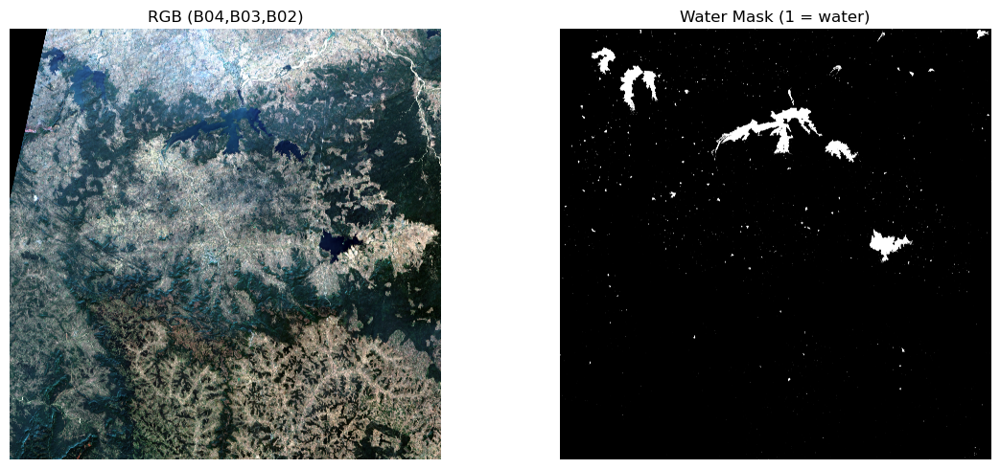

In [13]:
import matplotlib.pyplot as plt

# simple RGB using B04 (R), B03 (G), B02 (B)
rgb = np.stack([b04, b03, b02], axis=-1).astype("float32")

# normalize for display
for i in range(3):
    band = rgb[..., i]
    band_min, band_max = np.percentile(band, (2, 98))
    rgb[..., i] = np.clip((band - band_min) / (band_max - band_min + 1e-6), 0, 1)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.title("RGB (B04,B03,B02)")
plt.imshow(rgb)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Water Mask (1 = water)")
plt.imshow(water_mask_clean, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()



🚀 Processing: S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045
💧 Water pixels detected: 2396852
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNH_20251120T072045_6bands_10m.tif
👀 Showing preview...


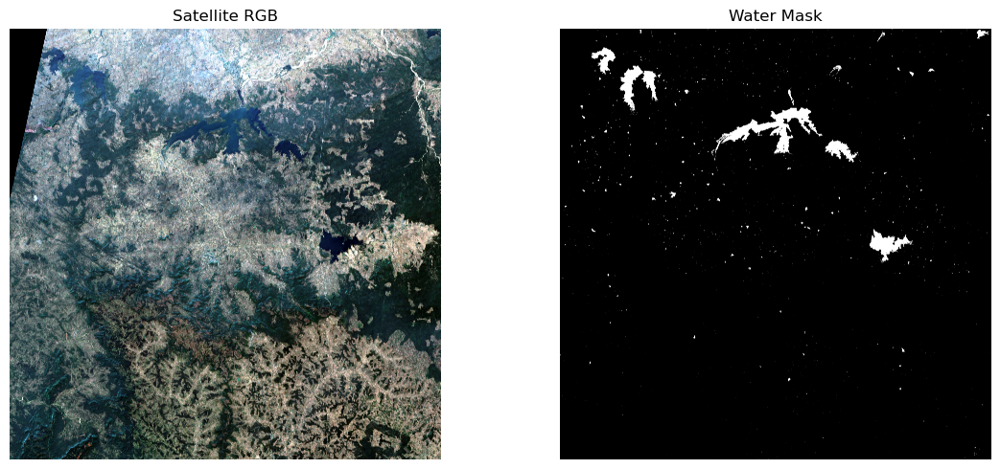


🚀 Processing: S2B_MSIL2A_20251120T050019_N0511_R119_T44QNJ_20251120T072045
💧 Water pixels detected: 1677752
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNJ_20251120T072045_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2B_MSIL2A_20251120T050019_N0511_R119_T44QNJ_20251120T072045_6bands_10m.tif
👀 Showing preview...


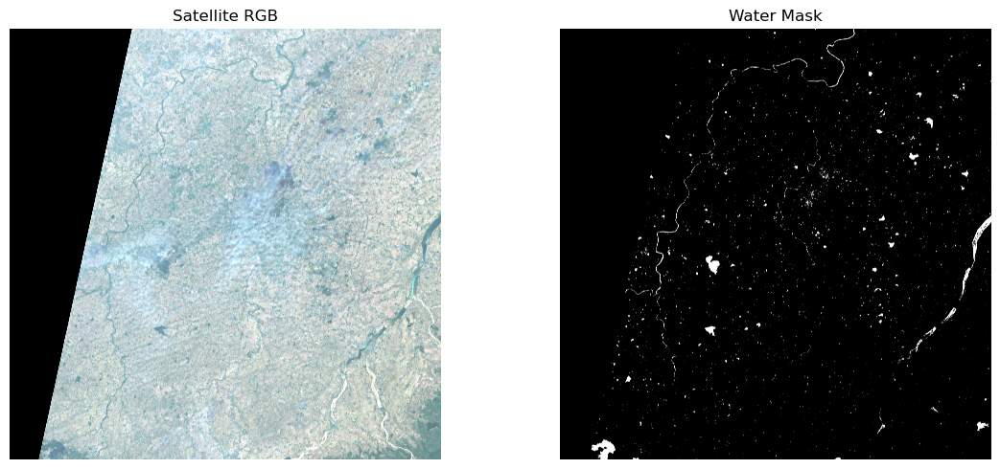


🚀 Processing: S2C_MSIL2A_20251108T051031_N0511_R019_T44QLG_20251108T082159
💧 Water pixels detected: 1933164
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251108T051031_N0511_R019_T44QLG_20251108T082159_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251108T051031_N0511_R019_T44QLG_20251108T082159_6bands_10m.tif
👀 Showing preview...


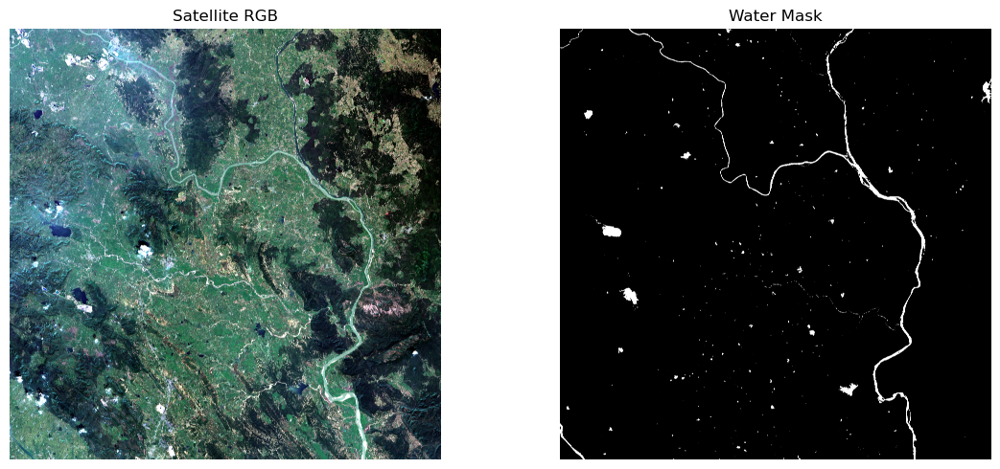


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QME_20251115T085100
💧 Water pixels detected: 1531956
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QME_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QME_20251115T085100_6bands_10m.tif
👀 Showing preview...


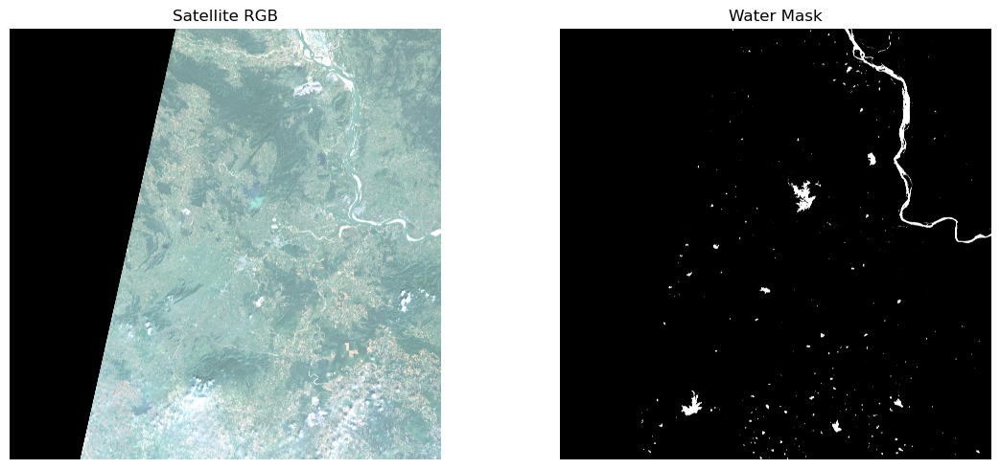


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QNE_20251115T085100
💧 Water pixels detected: 1916940
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QNE_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QNE_20251115T085100_6bands_10m.tif
👀 Showing preview...


MemoryError: Unable to allocate 3.59 GiB for an array with shape (10980, 10980, 4) and data type float64

<Figure size 1200x500 with 2 Axes>


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QNF_20251115T085100
💧 Water pixels detected: 358204
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QNF_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QNF_20251115T085100_6bands_10m.tif
👀 Showing preview...


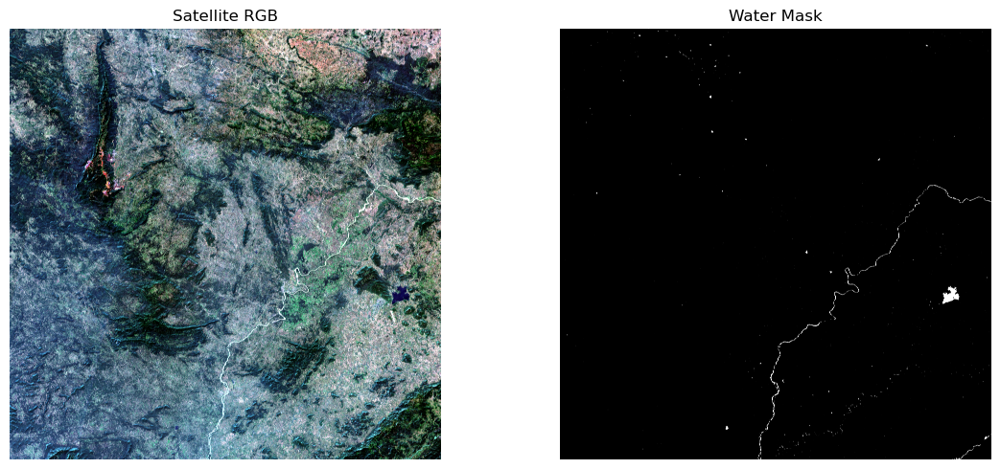


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QNG_20251115T085100
💧 Water pixels detected: 421428
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QNG_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QNG_20251115T085100_6bands_10m.tif
👀 Showing preview...


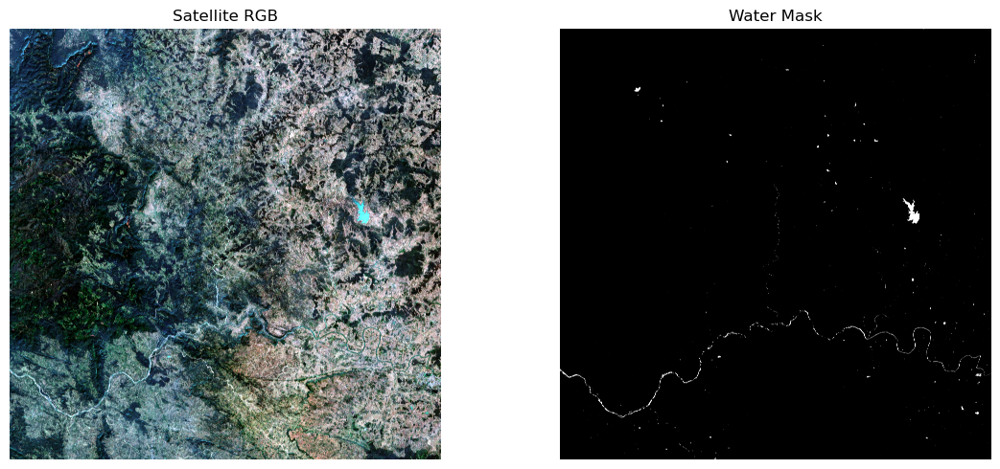


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QPE_20251115T085100
💧 Water pixels detected: 16736216
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPE_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPE_20251115T085100_6bands_10m.tif
👀 Showing preview...


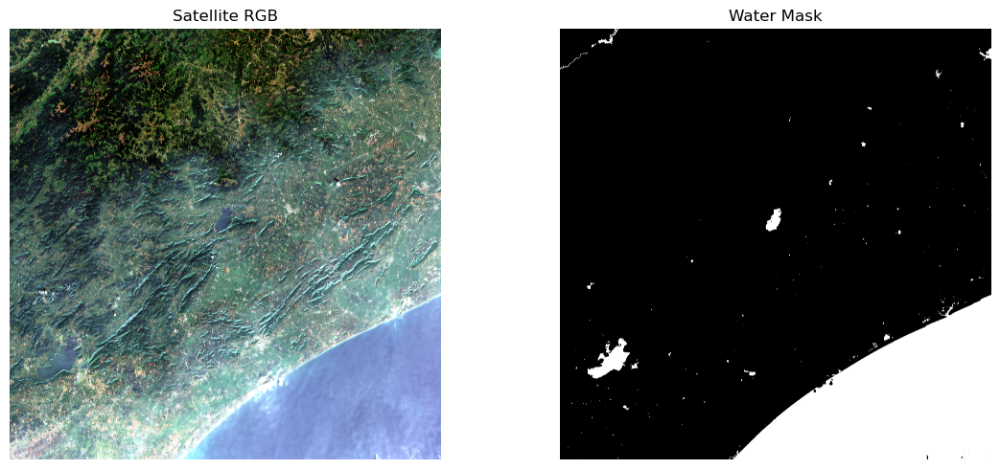


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100
💧 Water pixels detected: 3485580
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m.tif
👀 Showing preview...


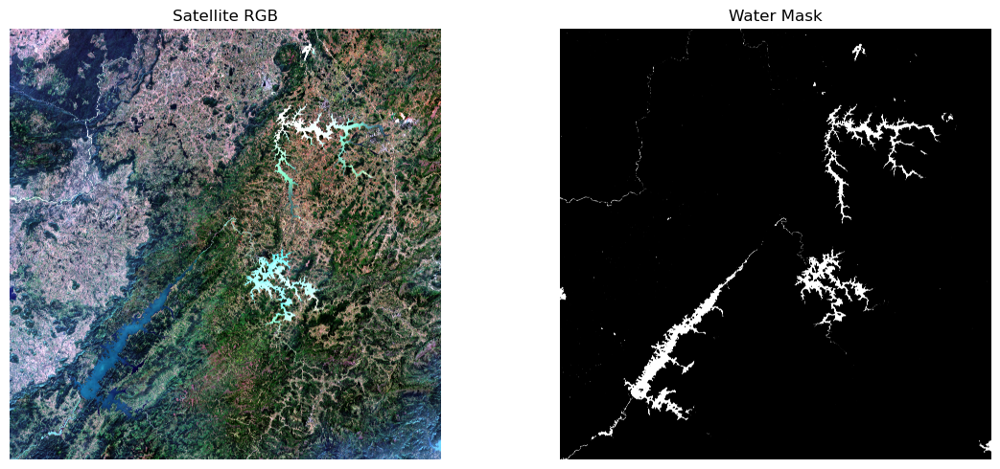


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QPG_20251115T085100
💧 Water pixels detected: 1394668
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPG_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPG_20251115T085100_6bands_10m.tif
👀 Showing preview...


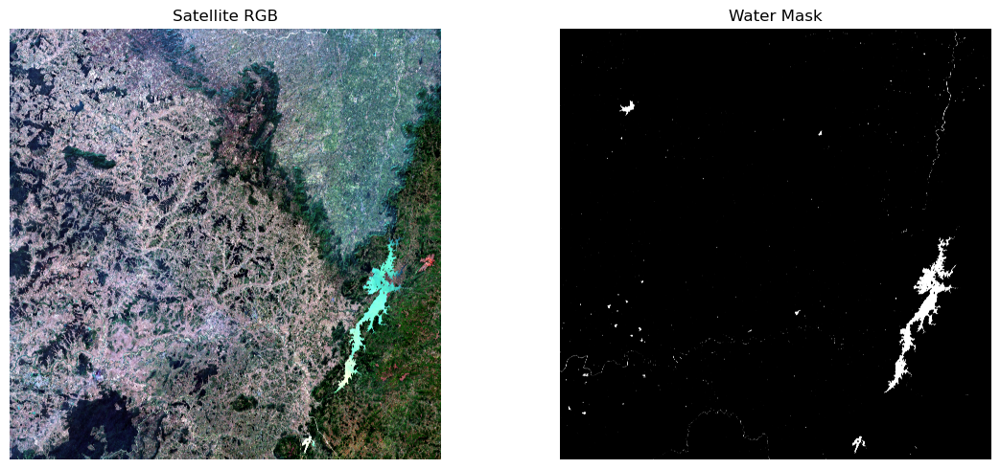


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QPH_20251115T085100
💧 Water pixels detected: 990264
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPH_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPH_20251115T085100_6bands_10m.tif
👀 Showing preview...


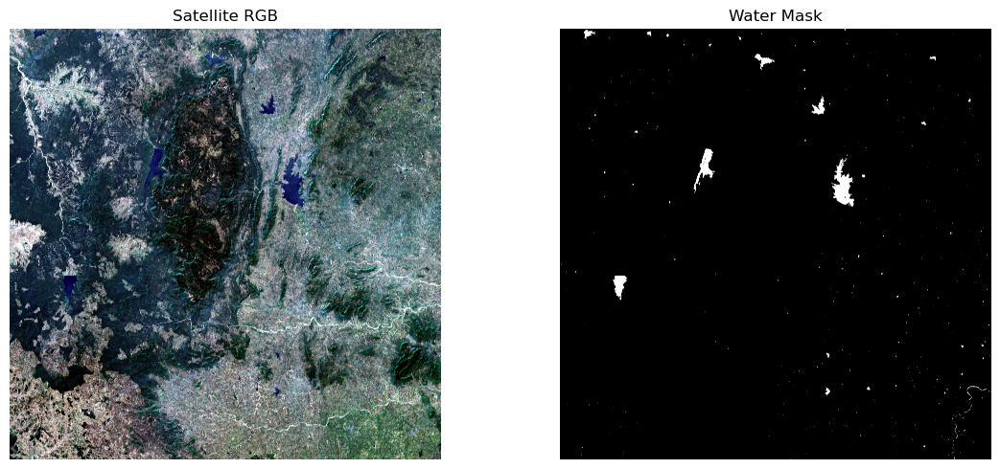


🚀 Processing: S2C_MSIL2A_20251115T050101_N0511_R119_T44QPJ_20251115T085100
💧 Water pixels detected: 1210456
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPJ_20251115T085100_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPJ_20251115T085100_6bands_10m.tif
👀 Showing preview...


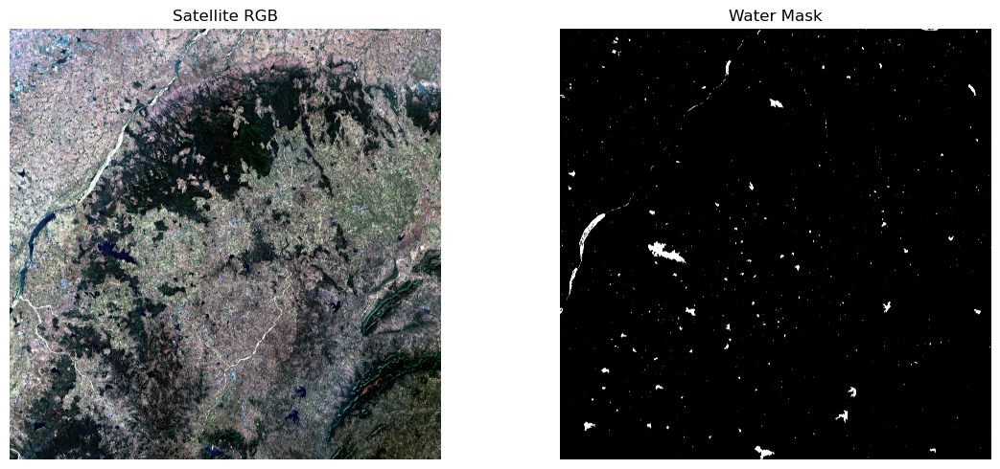


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QLE_20251118T085417
💧 Water pixels detected: 2998896
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLE_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLE_20251118T085417_6bands_10m.tif
👀 Showing preview...


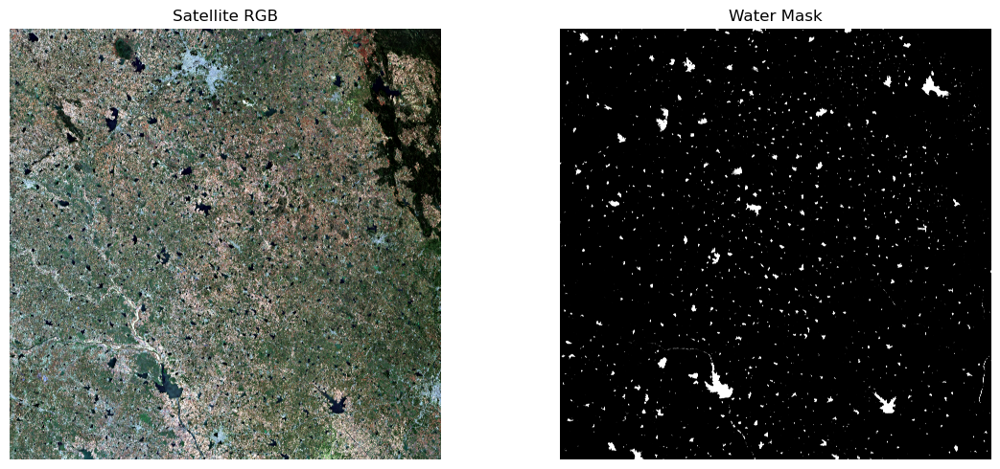


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QLF_20251118T085417
💧 Water pixels detected: 3808076
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLF_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLF_20251118T085417_6bands_10m.tif
👀 Showing preview...


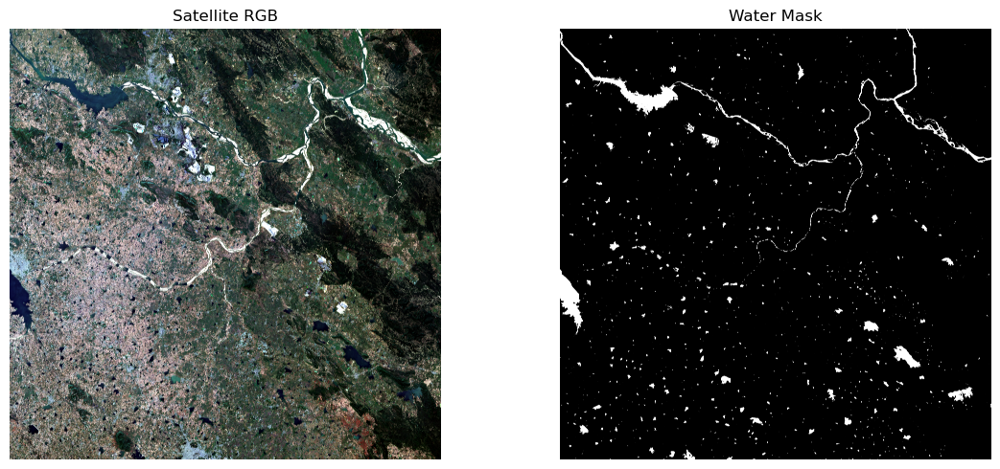


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QLH_20251118T085417
💧 Water pixels detected: 2316136
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLH_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLH_20251118T085417_6bands_10m.tif
👀 Showing preview...


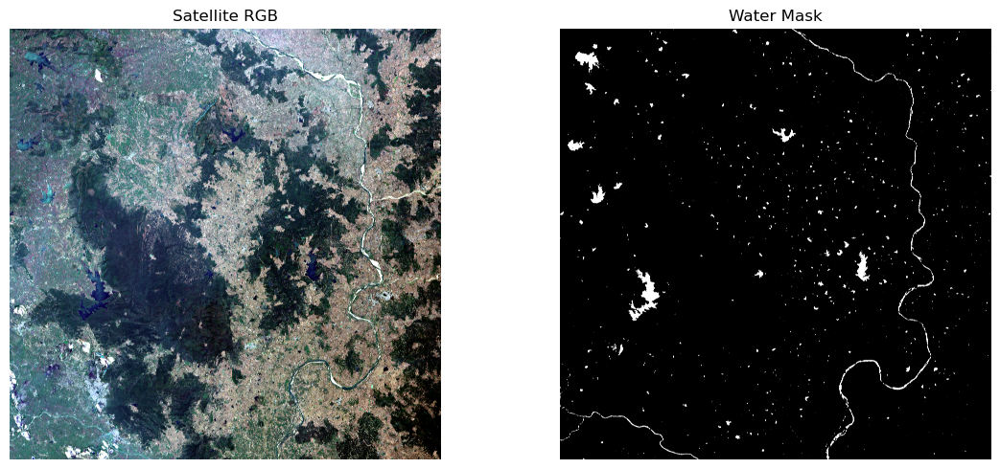


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QLJ_20251118T085417
💧 Water pixels detected: 3477436
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLJ_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QLJ_20251118T085417_6bands_10m.tif
👀 Showing preview...


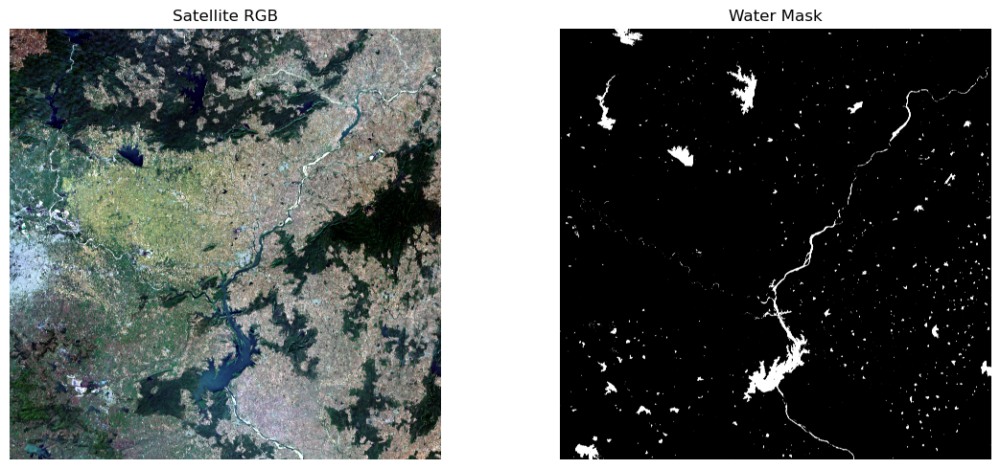


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QMF_20251118T085417
💧 Water pixels detected: 1472808
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMF_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMF_20251118T085417_6bands_10m.tif
👀 Showing preview...


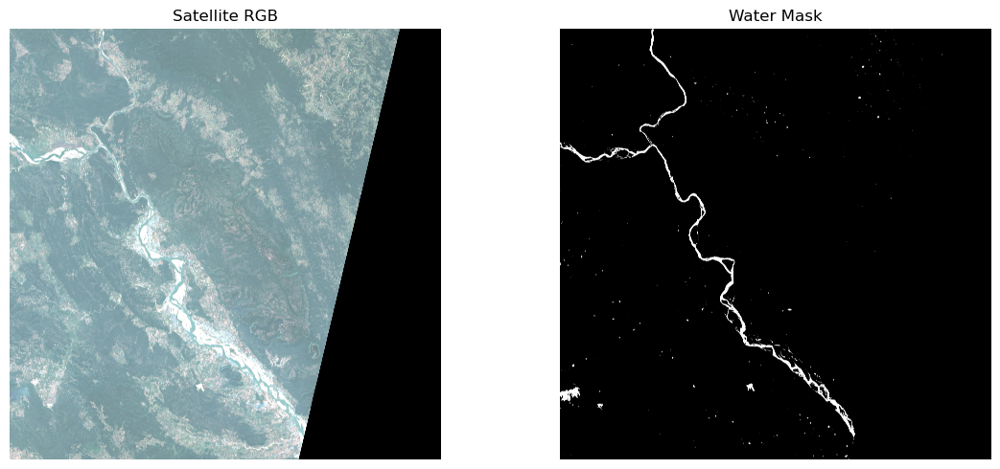


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QMG_20251118T085417
💧 Water pixels detected: 782764
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMG_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMG_20251118T085417_6bands_10m.tif
👀 Showing preview...


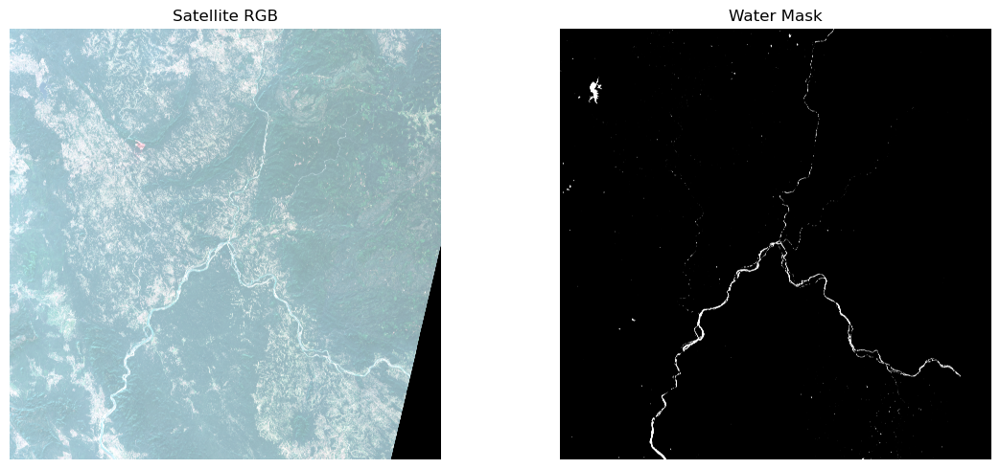


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QMH_20251118T085417
💧 Water pixels detected: 703928
6-band stack shape: (6, 10980, 10980)
📁 Saved mask → E:\dataset_s2\mask\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMH_20251118T085417_water_mask_10m.tif
📁 Saved 6-band image → E:\dataset_s2\image\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMH_20251118T085417_6bands_10m.tif
👀 Showing preview...


MemoryError: Unable to allocate 3.59 GiB for an array with shape (10980, 10980, 4) and data type float64

<Figure size 1200x500 with 2 Axes>


🚀 Processing: S2C_MSIL2A_20251118T051121_N0511_R019_T44QMJ_20251118T085417
❌ ERROR processing SEN2C_MSI_zzz_18NOV2025_019_T44QMJ_ESA_STUBBAOJD_20251118T085417: [WinError 3] The system cannot find the path specified: 'F:\\CG-ODISHA\\SEN2C_MSI_zzz_18NOV2025_019_T44QMJ_ESA_STUBBAOJD_20251118T085417\\S2C_MSIL2A_20251118T051121_N0511_R019_T44QMJ_20251118T085417.SAFE\\GRANULE\\L2A_T44QMJ_A006281_20251118T051240\\IMG_DATA\\R10m'


In [9]:
import os
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt


# ========= 1. SET YOUR BASE DIRECTORY HERE =========
BASE_DIR = r"F:\CG-ODISHA"   # <-- CHANGE if needed
rootdir = r"E:\dataset_s2"

# Output folders
IMAGE_OUT_DIR = os.path.join(rootdir, "image")
MASK_OUT_DIR = os.path.join(rootdir, "mask")
os.makedirs(IMAGE_OUT_DIR, exist_ok=True)
os.makedirs(MASK_OUT_DIR, exist_ok=True)


# ========= HELPER FUNCTIONS =========

def find_safe_dir(product_root):
    for name in os.listdir(product_root):
        path = os.path.join(product_root, name)
        if os.path.isdir(path) and name.endswith(".SAFE"):
            return path
    return None


def find_granule_dir(safe_dir):
    granule_root = os.path.join(safe_dir, "GRANULE")
    subdirs = [
        os.path.join(granule_root, d)
        for d in os.listdir(granule_root)
        if os.path.isdir(os.path.join(granule_root, d))
    ]
    if not subdirs:
        raise FileNotFoundError("No GRANULE subfolder found in " + granule_root)
    return subdirs[0]


def find_file(folder, suffix):
    for f in os.listdir(folder):
        if f.endswith(suffix):
            return os.path.join(folder, f)
    raise FileNotFoundError(f"Could not find file ending with {suffix} in {folder}")


def read_band(path):
    with rasterio.open(path) as src:
        return src.read(1), src.profile


def resample_to_10m(src_path, ref_path, resampling):
    with rasterio.open(src_path) as src:
        data = src.read(1)
        src_profile = src.profile

    with rasterio.open(ref_path) as ref:
        dst = np.empty((ref.height, ref.width), dtype=data.dtype)

        reproject(
            source=data,
            destination=dst,
            src_transform=src_profile["transform"],
            src_crs=src_profile["crs"],
            dst_transform=ref.transform,
            dst_crs=ref.crs,
            resampling=resampling,
            dst_width=ref.width,
            dst_height=ref.height
        )
    return dst


# ========= PROCESSING PIPELINE =========

def process_product_folder(product_root):
    safe_dir = find_safe_dir(product_root)
    if safe_dir is None:
        print(f"[SKIPPED] No SAFE folder → {product_root}")
        return

    product_id = os.path.splitext(os.path.basename(safe_dir))[0]
    print(f"\n🚀 Processing: {product_id}")

    granule_dir = find_granule_dir(safe_dir)
    img_10m_dir = os.path.join(granule_dir, "IMG_DATA", "R10m")
    img_20m_dir = os.path.join(granule_dir, "IMG_DATA", "R20m")

    # --- Band paths ---
    b02_path = find_file(img_10m_dir, "B02_10m.jp2")
    b03_path = find_file(img_10m_dir, "B03_10m.jp2")
    b04_path = find_file(img_10m_dir, "B04_10m.jp2")
    b08_path = find_file(img_10m_dir, "B08_10m.jp2")

    b11_path = find_file(img_20m_dir, "B11_20m.jp2")
    b12_path = find_file(img_20m_dir, "B12_20m.jp2")
    scl_path = find_file(img_20m_dir, "SCL_20m.jp2")

    # --- Read 10m bands ---
    b02, profile_10m = read_band(b02_path)
    b03, _ = read_band(b03_path)
    b04, _ = read_band(b04_path)
    b08, _ = read_band(b08_path)

    # --- Upscale 20m bands to 10m ---
    b11_10m = resample_to_10m(b11_path, b02_path, Resampling.bilinear)
    b12_10m = resample_to_10m(b12_path, b02_path, Resampling.bilinear)

    # --- SCL to 10m ---
    scl_10m = resample_to_10m(scl_path, b02_path, Resampling.nearest)

    WATER_CLASS = 6
    CLOUD_CLASSES = {8, 9, 10, 11}

    water_mask_clean = (
        (scl_10m == WATER_CLASS) &
        (~np.isin(scl_10m, list(CLOUD_CLASSES)))
    ).astype(np.uint8)

    print(f"💧 Water pixels detected: {int(water_mask_clean.sum())}")

    # --- Stack 6 bands ---
    bands_6 = np.stack([b02, b03, b04, b08, b11_10m, b12_10m], axis=0)
    print("6-band stack shape:", bands_6.shape)

    # --- Output paths ---
    mask_out = os.path.join(MASK_OUT_DIR, f"{product_id}_water_mask_10m.tif")
    img_out = os.path.join(IMAGE_OUT_DIR, f"{product_id}_6bands_10m.tif")

    # --- Base profile from B02, but force GTiff driver ---
    with rasterio.open(b02_path) as ref:
        base_profile = ref.profile.copy()

    base_profile.update(driver="GTiff")  # <--- IMPORTANT: write GeoTIFF

    # --- Save water mask (uint8, 1 band) ---
    mask_profile = base_profile.copy()
    mask_profile.update(count=1, dtype=rasterio.uint8)

    with rasterio.open(mask_out, "w", **mask_profile) as dst:
        dst.write(water_mask_clean, 1)

    print(f"📁 Saved mask → {mask_out}")

    # --- Save 6-band satellite image (float32, 6 bands) ---
    sat_profile = base_profile.copy()
    sat_profile.update(count=6, dtype=rasterio.float32)

    with rasterio.open(img_out, "w", **sat_profile) as dst:
        dst.write(b02.astype("float32"), 1)
        dst.write(b03.astype("float32"), 2)
        dst.write(b04.astype("float32"), 3)
        dst.write(b08.astype("float32"), 4)
        dst.write(b11_10m.astype("float32"), 5)
        dst.write(b12_10m.astype("float32"), 6)

        # Optional band names
        dst.set_band_description(1, "Blue (B02)")
        dst.set_band_description(2, "Green (B03)")
        dst.set_band_description(3, "Red (B04)")
        dst.set_band_description(4, "NIR (B08)")
        dst.set_band_description(5, "SWIR1 (B11)")
        dst.set_band_description(6, "SWIR2 (B12)")

    print(f"📁 Saved 6-band image → {img_out}")

    # ========= VISUAL PREVIEW =========
    print("👀 Showing preview...")

    rgb = np.stack([b04, b03, b02], axis=-1).astype("float32")

    # simple 2–98% stretch
    for i in range(3):
        p2, p98 = np.percentile(rgb[..., i], (2, 98))
        rgb[..., i] = np.clip((rgb[..., i] - p2) / (p98 - p2 + 1e-6), 0, 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.title("Satellite RGB")
    plt.imshow(rgb)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Water Mask")
    plt.imshow(water_mask_clean, cmap="gray")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# ========= RUN FOR ALL PRODUCT FOLDERS =========

for folder in os.listdir(BASE_DIR):
    path = os.path.join(BASE_DIR, folder)
    if not os.path.isdir(path):
        continue
    if not folder.startswith("SEN"):
        continue  # skip non-sentinel folders if any

    try:
        process_product_folder(path)
    except Exception as err:
        print(f"❌ ERROR processing {folder}: {err}")



📍 Loading Image: E:\sample_tile\image_tile\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m_y7344_x6480.tif
📍 Loading Mask:  E:\sample_tile\mask_tile\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m_y7344_x6480.tif


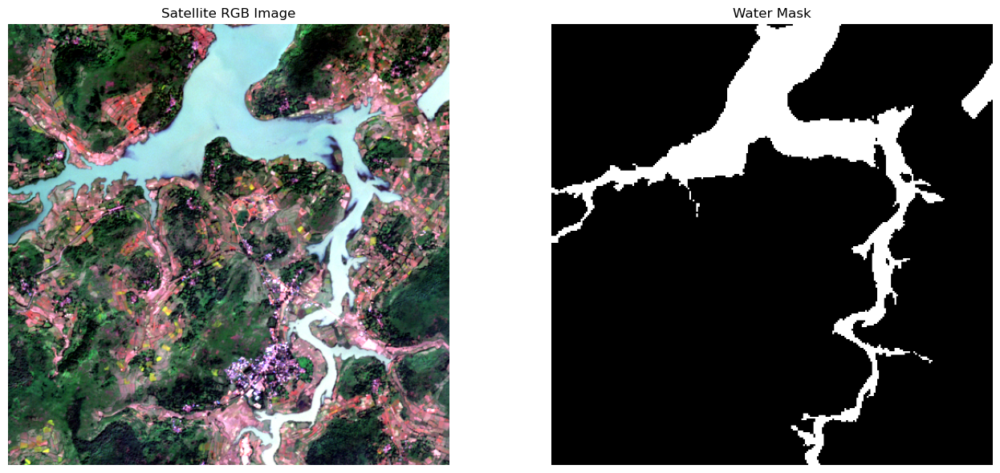

In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def normalize_rgb(rgb):
    """2–98% contrast stretch for better visibility."""
    rgb = rgb.astype(np.float32)
    for i in range(3):
        p2, p98 = np.percentile(rgb[..., i], (2, 98))
        rgb[..., i] = np.clip((rgb[..., i] - p2) / (p98 - p2 + 1e-6), 0, 1)
    return rgb


def show_satellite_and_mask(image_path, mask_path):
    """Displays 6-band satellite image (as RGB) and mask side by side."""
    
    print(f"\n📍 Loading Image: {image_path}")
    print(f"📍 Loading Mask:  {mask_path}")

    # Read satellite image
    with rasterio.open(image_path) as src:
        r = src.read(3)  # Red   = B04
        g = src.read(2)  # Green = B03
        b = src.read(1)  # Blue  = B02
        rgb = np.stack([r, g, b], axis=-1)

    # Enhance contrast for display
    rgb_norm = normalize_rgb(rgb)

    # Read mask
    with rasterio.open(mask_path) as mask_file:
        mask = mask_file.read(1)

    # --- Visualization ---
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.title("Satellite RGB Image")
    plt.imshow(rgb_norm)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Water Mask")
    plt.imshow(mask, cmap="gray")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# ------------ USAGE ------------
# 🔧 change path below to test different images

image_path = r"E:\sample_tile\image_tile\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m_y7344_x6480.tif"
mask_path = r"E:\sample_tile\mask_tile\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m_y7344_x6480.tif"

show_satellite_and_mask(image_path, mask_path)


In [9]:
import os
import rasterio
import numpy as np
from rasterio.windows import Window

# ========= CONFIG: SET YOUR PATHS HERE =========

# Full paths to ONE image and ONE mask
IMAGE_PATH = r"E:\dataset_s2\image\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m.tif"
MASK_PATH  = r"E:\dataset_s2\mask\S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_water_mask_10m.tif"

# Output folders for tiles
TILES_IMAGE_DIR = r"E:\sample_tile\image_tile"
TILES_MASK_DIR  = r"E:\sample_tile\mask_tile"

os.makedirs(TILES_IMAGE_DIR, exist_ok=True)
os.makedirs(TILES_MASK_DIR, exist_ok=True)

TILE_SIZE = 512
OVERLAP   = 80
STRIDE    = TILE_SIZE - OVERLAP   # 432 pixels


def get_start_indices(size, tile_size, stride):
    """
    Compute starting indices for tiling with overlap.
    Ensures coverage of the entire dimension.
    """
    if size <= tile_size:
        return [0]

    indices = []
    start = 0

    while True:
        indices.append(start)
        if start + tile_size >= size:
            break

        new_start = start + stride
        if new_start + tile_size > size:
            new_start = size - tile_size

        if new_start == start:
            break

        start = new_start

    return sorted(set(indices))


def tile_image_and_mask(img_path, mask_path, tiles_img_dir, tiles_mask_dir):
    img_name = os.path.basename(img_path)
    base_id = os.path.splitext(img_name)[0]  # will keep full name without .tif

    print(f"\n🧩 Tiling: {base_id}")

    # Open image & mask
    with rasterio.open(img_path) as src_img, rasterio.open(mask_path) as src_mask:
        if (src_img.width != src_mask.width) or (src_img.height != src_mask.height):
            print(f"⚠️ Skipping {base_id}: image/mask size mismatch")
            return

        height, width = src_img.height, src_img.width

        x_indices = get_start_indices(width,  TILE_SIZE, STRIDE)
        y_indices = get_start_indices(height, TILE_SIZE, STRIDE)

        print(f"   Image size: {width} x {height}")
        print(f"   Tiles in x: {len(x_indices)}, Tiles in y: {len(y_indices)}")

        tile_count = 0

        for y in y_indices:
            for x in x_indices:
                window = Window(col_off=x, row_off=y, width=TILE_SIZE, height=TILE_SIZE)

                # Read image tile (all bands)
                img_tile = src_img.read(window=window)  # shape: (bands, 512, 512)

                # Read mask tile (single band)
                mask_tile = src_mask.read(1, window=window)

                # Prepare profiles for writing
                img_profile = src_img.profile.copy()
                img_profile.update({
                    "height": TILE_SIZE,
                    "width": TILE_SIZE,
                    "transform": src_img.window_transform(window)
                })

                mask_profile = src_mask.profile.copy()
                mask_profile.update({
                    "height": TILE_SIZE,
                    "width": TILE_SIZE,
                    "transform": src_mask.window_transform(window),
                    "count": 1
                })

                # Output filenames (aligned naming)
                tile_id = f"{base_id}_y{y}_x{x}"
                out_img_path  = os.path.join(tiles_img_dir,  f"{tile_id}.tif")
                out_mask_path = os.path.join(tiles_mask_dir, f"{tile_id}.tif")

                # Write image tile
                with rasterio.open(out_img_path, "w", **img_profile) as dst_img:
                    dst_img.write(img_tile)

                # Write mask tile
                with rasterio.open(out_mask_path, "w", **mask_profile) as dst_mask:
                    dst_mask.write(mask_tile, 1)

                tile_count += 1

        print(f"   ✅ Created {tile_count} tiles for {base_id}")


def main():
    # Just tile the single image+mask you configured above
    if not os.path.exists(IMAGE_PATH):
        print(f"❌ IMAGE_PATH does not exist: {IMAGE_PATH}")
        return

    if not os.path.exists(MASK_PATH):
        print(f"❌ MASK_PATH does not exist: {MASK_PATH}")
        return

    tile_image_and_mask(IMAGE_PATH, MASK_PATH, TILES_IMAGE_DIR, TILES_MASK_DIR)


if __name__ == "__main__":
    main()



🧩 Tiling: S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m
   Image size: 10980 x 10980
   Tiles in x: 26, Tiles in y: 26
   ✅ Created 676 tiles for S2C_MSIL2A_20251115T050101_N0511_R119_T44QPF_20251115T085100_6bands_10m


###########################################

In [ ]:
import os
import rasterio
import numpy as np
from rasterio.windows import Window


DATASET_DIR      = r"E:\dataset_s2"
IMAGE_DIR        = os.path.join(DATASET_DIR, "image")
MASK_DIR         = os.path.join(DATASET_DIR, "mask")

TILES_IMAGE_DIR  = os.path.join(DATASET_DIR, "tiles_image")
TILES_MASK_DIR   = os.path.join(DATASET_DIR, "tiles_mask")

os.makedirs(TILES_IMAGE_DIR, exist_ok=True)
os.makedirs(TILES_MASK_DIR, exist_ok=True)

TILE_SIZE = 512
OVERLAP   = 80
STRIDE    = TILE_SIZE - OVERLAP   # 432 pixels


def get_start_indices(size, tile_size, stride):
    """
    Compute starting indices for tiling with overlap.
    Ensures coverage of the entire dimension.
    """
    if size <= tile_size:
        return [0]

    indices = []
    start = 0

    while True:
        indices.append(start)
        if start + tile_size >= size:
            break

        new_start = start + stride
        if new_start + tile_size > size:
            new_start = size - tile_size

        if new_start == start:
            break

        start = new_start

    return sorted(set(indices))


def tile_image_and_mask(img_path, mask_path, tiles_img_dir, tiles_mask_dir):
    img_name = os.path.basename(img_path)
    base_id = img_name.replace("_6bands_10m.tif", "")  # adapt if your pattern is different

    print(f"\n🧩 Tiling: {base_id}")

    # Open image & mask
    with rasterio.open(img_path) as src_img, rasterio.open(mask_path) as src_mask:
        if (src_img.width != src_mask.width) or (src_img.height != src_mask.height):
            print(f"⚠️ Skipping {base_id}: image/mask size mismatch")
            return

        height, width = src_img.height, src_img.width

        x_indices = get_start_indices(width,  TILE_SIZE, STRIDE)
        y_indices = get_start_indices(height, TILE_SIZE, STRIDE)

        print(f"   Image size: {width} x {height}")
        print(f"   Tiles in x: {len(x_indices)}, Tiles in y: {len(y_indices)}")

        tile_count = 0

        for y in y_indices:
            for x in x_indices:
                window = Window(col_off=x, row_off=y, width=TILE_SIZE, height=TILE_SIZE)

                # Read image tile (all bands)
                img_tile = src_img.read(window=window)  # shape: (bands, 512, 512)

                # Read mask tile (single band)
                mask_tile = src_mask.read(1, window=window)

                # Prepare profiles for writing
                img_profile = src_img.profile.copy()
                img_profile.update({
                    "height": TILE_SIZE,
                    "width": TILE_SIZE,
                    "transform": src_img.window_transform(window)
                })

                mask_profile = src_mask.profile.copy()
                mask_profile.update({
                    "height": TILE_SIZE,
                    "width": TILE_SIZE,
                    "transform": src_mask.window_transform(window),
                    "count": 1
                })

                # Output filenames (aligned naming)
                tile_id = f"{base_id}_y{y}_x{x}"
                out_img_path  = os.path.join(tiles_img_dir,  f"{tile_id}.tif")
                out_mask_path = os.path.join(tiles_mask_dir, f"{tile_id}.tif")

                # Write image tile
                with rasterio.open(out_img_path, "w", **img_profile) as dst_img:
                    dst_img.write(img_tile)

                # Write mask tile
                with rasterio.open(out_mask_path, "w", **mask_profile) as dst_mask:
                    dst_mask.write(mask_tile, 1)

                tile_count += 1

        print(f"   ✅ Created {tile_count} tiles for {base_id}")


def main():
    img_files = sorted([f for f in os.listdir(IMAGE_DIR) if f.lower().endswith(".tif")])

    print(f"Found {len(img_files)} images in {IMAGE_DIR}")

    for img_file in img_files:
        img_path = os.path.join(IMAGE_DIR, img_file)

        # Derive corresponding mask filename
        base_id = img_file.replace("_6bands_10m.tif", "")
        mask_file = base_id + "_water_mask_10m.tif"  # adapt if name format differs
        mask_path = os.path.join(MASK_DIR, mask_file)

        if not os.path.exists(mask_path):
            print(f"⚠️ No mask found for image {img_file}, expected {mask_file}. Skipping.")
            continue

        try:
            tile_image_and_mask(img_path, mask_path, TILES_IMAGE_DIR, TILES_MASK_DIR)
        except Exception as e:
            print(f"❌ Error while tiling {img_file}: {e}")


if __name__ == "__main__":
    main()
